In [185]:
from matplotlib.patches import ConnectionPatch
import matplotlib.pyplot as plt
import numpy as np
import scipy.spatial.distance as dist

# Dynamic programming function

In [12]:
def dp(dist_mat):
    """
    Find minimum-cost path through matrix `dist_mat` using dynamic programming.

    The cost of a path is defined as the sum of the matrix entries on that
    path. See the following for details of the algorithm:

    - http://en.wikipedia.org/wiki/Dynamic_time_warping
    - https://www.ee.columbia.edu/~dpwe/resources/matlab/dtw/dp.m

    The notation in the first reference was followed, while Dan Ellis's code
    (second reference) was used to check for correctness. Returns a list of
    path indices and the cost matrix.
    """

    N, M = dist_mat.shape
    
    # Initialize the cost matrix
    cost_mat = np.zeros((N + 1, M + 1))
    for i in range(1, N + 1):
        cost_mat[i, 0] = np.inf
    for i in range(1, M + 1):
        cost_mat[0, i] = np.inf

    # Fill the cost matrix while keeping traceback information
    traceback_mat = np.zeros((N, M))
    for i in range(N):
        for j in range(M):
            penalty = [
                cost_mat[i, j],      # match (0)
                cost_mat[i, j + 1],  # insertion (1)
                cost_mat[i + 1, j]]  # deletion (2)
            i_penalty = np.argmin(penalty)
            cost_mat[i + 1, j + 1] = dist_mat[i, j] + penalty[i_penalty]
            traceback_mat[i, j] = i_penalty

    # Traceback from bottom right
    i = N - 1
    j = M - 1
    path = [(i, j)]
    while i > 0 or j > 0:
        tb_type = traceback_mat[i, j]
        if tb_type == 0:
            # Match
            i = i - 1
            j = j - 1
        elif tb_type == 1:
            # Insertion
            i = i - 1
        elif tb_type == 2:
            # Deletion
            j = j - 1
        path.append((i, j))

    # Strip infinity edges from cost_mat before returning
    cost_mat = cost_mat[1:, 1:]
    return (path[::-1], cost_mat)

## Univariate exmaple

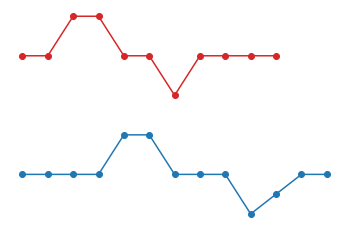

In [187]:
# example 1
x = np.array([0, 0, 1, 1, 0, 0, -1, 0, 0, 0, 0])
y = np.array([0, 0, 0, 0, 1, 1, 0, 0, 0, -1, -0.5, 0, 0])

fig = plt.figure(figsize=(6, 4))
fig.patch.set_facecolor('white')  # Set the background color of the entire figure to white
plt.plot(np.arange(x.shape[0]), x + 1.5, "-o", c="C3")
plt.plot(np.arange(y.shape[0]), y - 1.5, "-o", c="C0")
plt.axis("off")

plt.show()

In [188]:
# Distance matrix
N = x.shape[0]
M = y.shape[0]
dist_mat = np.zeros((N, M))
for i in range(N):
    for j in range(M):
        dist_mat[i, j] = abs(x[i] - y[j])
print(dist_mat)

[[0.  0.  0.  0.  1.  1.  0.  0.  0.  1.  0.5 0.  0. ]
 [0.  0.  0.  0.  1.  1.  0.  0.  0.  1.  0.5 0.  0. ]
 [1.  1.  1.  1.  0.  0.  1.  1.  1.  2.  1.5 1.  1. ]
 [1.  1.  1.  1.  0.  0.  1.  1.  1.  2.  1.5 1.  1. ]
 [0.  0.  0.  0.  1.  1.  0.  0.  0.  1.  0.5 0.  0. ]
 [0.  0.  0.  0.  1.  1.  0.  0.  0.  1.  0.5 0.  0. ]
 [1.  1.  1.  1.  2.  2.  1.  1.  1.  0.  0.5 1.  1. ]
 [0.  0.  0.  0.  1.  1.  0.  0.  0.  1.  0.5 0.  0. ]
 [0.  0.  0.  0.  1.  1.  0.  0.  0.  1.  0.5 0.  0. ]
 [0.  0.  0.  0.  1.  1.  0.  0.  0.  1.  0.5 0.  0. ]
 [0.  0.  0.  0.  1.  1.  0.  0.  0.  1.  0.5 0.  0. ]]


Alignment cost: 0.5000
Normalized alignment cost: 0.0208


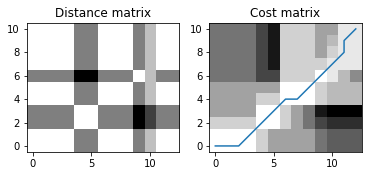

In [189]:
# DTW
path, cost_mat = dp(dist_mat)
print("Alignment cost: {:.4f}".format(cost_mat[N - 1, M - 1]))
print("Normalized alignment cost: {:.4f}".format(cost_mat[N - 1, M - 1]/(N + M)))

fig = plt.figure(figsize=(6, 4))
fig.patch.set_facecolor('white')
plt.subplot(121)
plt.title("Distance matrix")
plt.imshow(dist_mat, cmap=plt.cm.binary, interpolation="nearest", origin="lower")
plt.subplot(122)
plt.title("Cost matrix")
plt.imshow(cost_mat, cmap=plt.cm.binary, interpolation="nearest", origin="lower")
x_path, y_path = zip(*path)
plt.plot(y_path, x_path);

(-0.6000000000000001, 12.6, -2.75, 2.75)

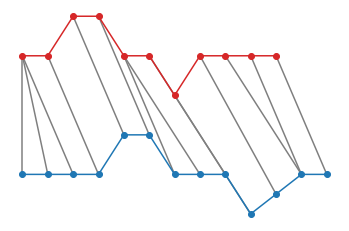

In [190]:
fig = plt.figure()
fig.patch.set_facecolor('white')
for x_i, y_j in path:
    plt.plot([x_i, y_j], [x[x_i] + 1.5, y[y_j] - 1.5], c="C7")
plt.plot(np.arange(x.shape[0]), x + 1.5, "-o", c="C3")
plt.plot(np.arange(y.shape[0]), y - 1.5, "-o", c="C0")
plt.axis("off")

Alignment cost: 2.5000
Normalized alignment cost: 0.1042

Alignment cost: 1.7500
Normalized alignment cost: 0.0972

Alignment cost: 0.5000
Normalized alignment cost: 0.0208



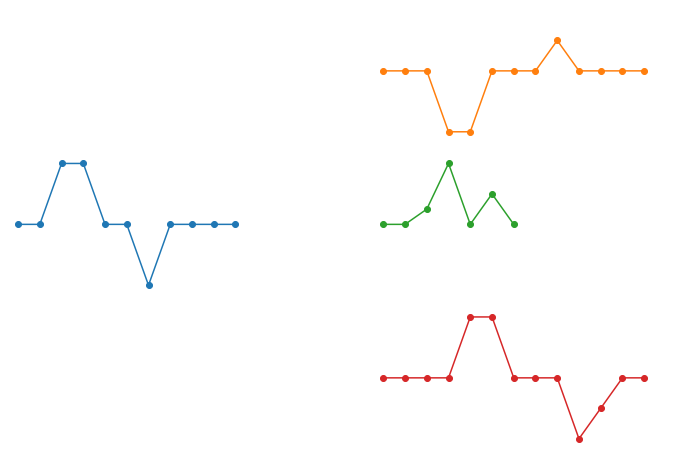

In [191]:
a = np.array([0, 0, 1, 1, 0, 0, -1, 0, 0, 0, 0])
b = np.array([0, 0, 0, 0, 1, 1, 0, 0, 0, -1, -0.5, 0, 0])
c = np.array([0, 0, 0, -1, -1, 0, 0, 0, 0.5, 0, 0, 0, 0])
d = np.array([0, 0, 0.25, 1, 0, 0.5, 0])

fig = plt.figure(figsize=(12, 8))
fig.patch.set_facecolor('white')
ax1 = fig.add_subplot(323)
ax2 = fig.add_subplot(322)
ax3 = fig.add_subplot(324)
ax4 = fig.add_subplot(326)
# fig = plt.figure(figsize=(6, 8))
ax1.plot(np.arange(a.shape[0]), a, "-o", c="C0")
ax2.plot(np.arange(c.shape[0]), c, "-o", c="C1")
ax3.plot(np.arange(d.shape[0]), d, "-o", c="C2")
ax4.plot(np.arange(b.shape[0]), b, "-o", c="C3")
for ax in [ax1, ax2, ax3, ax4]:
    ax.axis("off")
    ax.set_xlim([-0.5, 13.5])
    ax.set_ylim([-1.05, 1.05])
    
for cur_b in [c, d, b]:

    # Distance matrix
    N = a.shape[0]
    M = cur_b.shape[0]
    dist_mat = np.zeros((N, M))
    for i in range(N):
        for j in range(M):
    #         print(a[i], b[j], abs(a[i] - b[j]))
            dist_mat[i, j] = abs(a[i] - cur_b[j])

    # DTW
    path, cost_mat = dp(dist_mat)
    print("Alignment cost: {:.4f}".format(cost_mat[N - 1, M - 1]))
    print("Normalized alignment cost: {:.4f}".format(cost_mat[N - 1, M - 1]/(N + M)))
    print()

(0.7, 7.3, -1.75, 3.75)

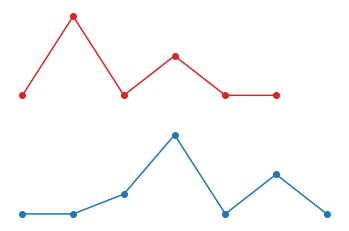

In [192]:
# example 2
x = np.array([0, 2, 0, 1, 0, 0])
y = np.array([0, 0, 0.5, 2, 0, 1, 0])

fig = plt.figure(figsize=(6, 4))
fig.patch.set_facecolor('white')
plt.plot(np.arange(x.shape[0]) + 1, x + 1.5, "-o", c="C3")
plt.plot(np.arange(y.shape[0]) + 1, y - 1.5, "-o", c="C0")
plt.axis("off")

[(0, 0), (0, 1), (0, 2), (1, 3), (2, 4), (3, 5), (4, 6), (5, 6)]
[[0.  0.  0.5 2.5 2.5 3.5 3.5]
 [2.  2.  1.5 0.5 2.5 3.5 5.5]
 [2.  2.  2.  2.5 0.5 1.5 1.5]
 [3.  3.  2.5 3.  1.5 0.5 1.5]
 [3.  3.  3.  4.5 1.5 1.5 0.5]
 [3.  3.  3.5 5.  1.5 2.5 0.5]]


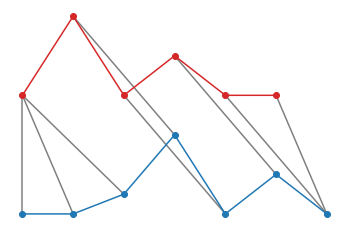

In [193]:
# Distance matrix
N = x.shape[0]
M = y.shape[0]
dist_mat = np.zeros((N, M))
for i in range(N):
    for j in range(M):
        dist_mat[i, j] = abs(x[i] - y[j])

# DTW
path, cost_mat = dp(dist_mat)
print(path)
print(cost_mat)

# Plot alignment
fig = plt.figure(figsize=(6, 4))
fig.patch.set_facecolor('white')
for x_i, y_j in path:
    plt.plot([x_i, y_j], [x[x_i] + 1.5, y[y_j] - 1.5], c="C7")

plt.plot(np.arange(x.shape[0]), x + 1.5, "-o", c="C3")
plt.plot(np.arange(y.shape[0]), y - 1.5, "-o", c="C0")
plt.axis("off");

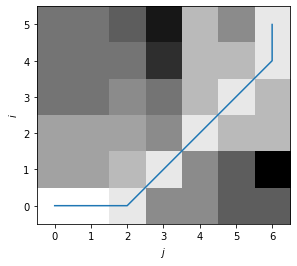

In [194]:
fig = plt.figure(figsize=(6, 4))
fig.patch.set_facecolor('white')
plt.imshow(cost_mat, cmap=plt.cm.binary, interpolation="nearest", origin="lower")
x_path, y_path = zip(*path)
plt.plot(y_path, x_path)
plt.xlabel("$j$")
plt.ylabel("$i$");

(-0.6000000000000001, 12.6, -1.7, 2.7)

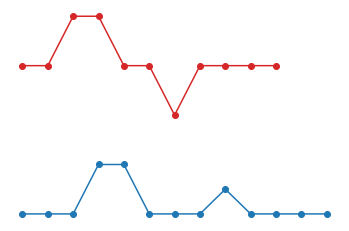

In [195]:
#example
x = np.array([0, 0, 1, 1, 0, 0, -1, 0, 0, 0, 0])
y = np.array([0, 0, 0, 1, 1, 0, 0, 0, 0.5, 0, 0, 0, 0])

fig = plt.figure(figsize=(6, 4))
fig.patch.set_facecolor('white')
plt.plot(np.arange(x.shape[0]), x + 1.5, "-o", c="C3")
plt.plot(np.arange(y.shape[0]), y - 1.5, "-o", c="C0")
plt.axis("off")

Alignment cost: 1.5000
Normalized alignment cost: 0.0625
[(0, 0), (0, 1), (1, 2), (2, 3), (3, 4), (4, 5), (4, 6), (5, 7), (6, 8), (7, 9), (8, 10), (9, 11), (10, 12)]
[[0.  0.  0.  1.  2.  2.  2.  2.  2.5 2.5 2.5 2.5 2.5]
 [0.  0.  0.  1.  2.  2.  2.  2.  2.5 2.5 2.5 2.5 2.5]
 [1.  1.  1.  0.  0.  1.  2.  3.  2.5 3.5 3.5 3.5 3.5]
 [2.  2.  2.  0.  0.  1.  2.  3.  3.  3.5 4.5 4.5 4.5]
 [2.  2.  2.  1.  1.  0.  0.  0.  0.5 0.5 0.5 0.5 0.5]
 [2.  2.  2.  2.  2.  0.  0.  0.  0.5 0.5 0.5 0.5 0.5]
 [3.  3.  3.  4.  4.  1.  1.  1.  1.5 1.5 1.5 1.5 1.5]
 [3.  3.  3.  4.  5.  1.  1.  1.  1.5 1.5 1.5 1.5 1.5]
 [3.  3.  3.  4.  5.  1.  1.  1.  1.5 1.5 1.5 1.5 1.5]
 [3.  3.  3.  4.  5.  1.  1.  1.  1.5 1.5 1.5 1.5 1.5]
 [3.  3.  3.  4.  5.  1.  1.  1.  1.5 1.5 1.5 1.5 1.5]]


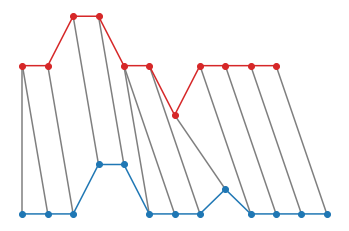

In [196]:
# Distance matrix
N = x.shape[0]
M = y.shape[0]
dist_mat = np.zeros((N, M))
for i in range(N):
    for j in range(M):
        dist_mat[i, j] = abs(x[i] - y[j])

# DTW
path, cost_mat = dp(dist_mat)
print("Alignment cost: {:.4f}".format(cost_mat[N - 1, M - 1]))
print("Normalized alignment cost: {:.4f}".format(cost_mat[N - 1, M - 1]/(N + M)))

# Plot alignment
fig = plt.figure(figsize=(6, 4))
fig.patch.set_facecolor('white')
for x_i, y_j in path:
    plt.plot([x_i, y_j], [x[x_i] + 1.5, y[y_j] - 1.5], c="C7")
plt.plot(np.arange(x.shape[0]), x + 1.5, "-o", c="C3")
plt.plot(np.arange(y.shape[0]), y - 1.5, "-o", c="C0")
plt.axis("off");

print(path)
print(cost_mat)

# Multivariate Example

In [6]:
from scipy.io import wavfile
import IPython.display as ipd
import librosa
import librosa.display
import numpy as np
from matplotlib.patches import ConnectionPatch
import matplotlib.pyplot as plt
import numpy as np
import scipy.spatial.distance as dist

In [148]:
x_fn = "../Dataset/01.Ha\'/Ha\'_M1_1.wav"
f_s, x = wavfile.read(x_fn)
print(f_s,x.shape)
ipd.Audio(x_fn)

48000 (576000, 2)


In [146]:
y_fn = "../Dataset/01.Ha\'/Ha\'_M1_2.wav"
f_s, y = wavfile.read(y_fn)
print(f_s,y.shape)
ipd.Audio(y_fn)

48000 (645120, 2)


In [20]:
# pake librosa
x_fn = "../Dataset/01.Ha\'/Ha\'_RY1_1.wav"
x , f_s = librosa.load(x_fn)
print(x.shape,f_s)
ipd.Audio(x_fn)

(273950,) 22050


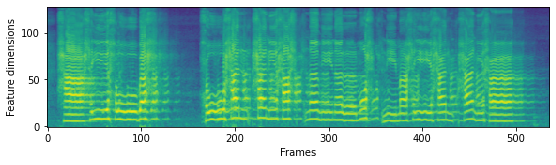

In [21]:
# Mel-scale spectrogram
n_fft = int(0.025*f_s)      # 25 ms
hop_length = int(0.01*f_s)  # 10 ms
mel_spec_x = librosa.feature.melspectrogram(
    y=x, sr=f_s, n_mels=128,
    n_fft=2048, hop_length=512
)
log_mel_spec_x = np.log(mel_spec_x + 1e-10)  # Add a small value to avoid log(0)

# Plot log-Mel spectrogram
fig, ax = plt.subplots(figsize=(9, 5))
fig.patch.set_facecolor('white')
ax.imshow(log_mel_spec_x, origin="lower", interpolation="nearest")
plt.ylabel("Feature dimensions")
plt.xlabel("Frames")
plt.show()


In [26]:
# pake librosa
y_fn = "../Dataset/01.Ha\'/Ha\'_M1_1.wav"
y , f_s = librosa.load(y_fn)
print(y.shape,f_s)
ipd.Audio(y_fn)

(264600,) 22050


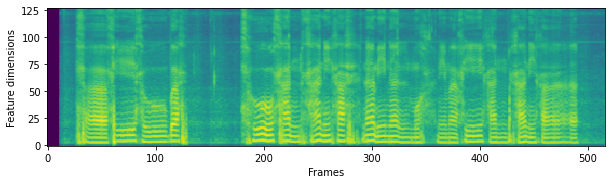

In [27]:
# Mel-scale spectrogram
n_fft = int(0.025*f_s)      # 25 ms
hop_length = int(0.01*f_s)  # 10 ms
mel_spec_y = librosa.feature.melspectrogram(
    y=y, sr=f_s, n_mels=128,
    n_fft=2048, hop_length=512
)
log_mel_spec_y = np.log(mel_spec_y + 1e-10)  # Add a small value to avoid log(0)

# Plot log-Mel spectrogram
fig, ax = plt.subplots(figsize=(10, 5))
fig.patch.set_facecolor('white')
ax.imshow(log_mel_spec_y, origin="lower", interpolation="nearest")
plt.ylabel("Feature dimensions")
plt.xlabel("Frames")
plt.show()


In [28]:
x_seq = log_mel_spec_x.T
y_seq = log_mel_spec_y.T

print(x_seq.shape,y_seq.shape)

dist_mat = dist.cdist(x_seq, y_seq, "cosine")
path, cost_mat = dp(dist_mat)
print("Alignment cost: {:.4f}".format(cost_mat[-1, -1]))

(536, 128) (517, 128)
Alignment cost: 96.7899


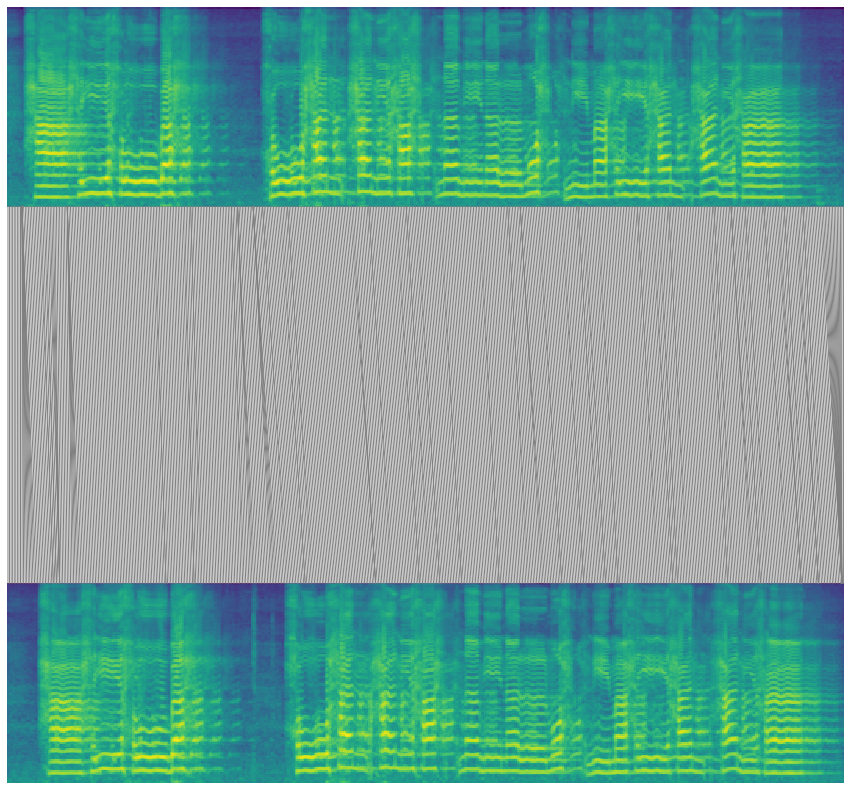

In [25]:
fig = plt.figure(figsize = (15,15))
fig.patch.set_facecolor('white')
ax1 = fig.add_subplot(311)
ax2 = fig.add_subplot(313)

ax1.imshow(log_mel_spec_x, origin="lower", interpolation="nearest")
ax2.imshow(log_mel_spec_y, origin="lower", interpolation="nearest")
ax1.axis("off")
ax2.axis("off")

for x_i, y_j in path:
    con = ConnectionPatch(
        xyA=(x_i, 0), xyB=(y_j, log_mel_spec_y.shape[0] - 1), coordsA="data", coordsB="data",
        axesA=ax1, axesB=ax2, color="C7"
        )
    ax2.add_artist(con)

# =======

In [123]:
# tes yang diatas nya dengan beda
audio_file = "../Dataset/01.Ha\'/Ha\'_M1_1.wav"
y , sr = librosa.load(audio_file)
print(y.shape, sr)
ipd.Audio(x_fn)

(264600,) 22050


In [124]:
print(y)

[ 0.          0.          0.         ... -0.00265897 -0.00145254
 -0.00027109]


In [125]:
y_preemphasized = librosa.effects.preemphasis(y)
print(y_preemphasized)

[ 0.          0.          0.         ... -0.00077838  0.00112665
  0.00113787]


In [126]:
mel_spectogram = librosa.feature.melspectrogram(y=y, sr=sr, n_mels = 40)

In [127]:
print(mel_spectogram, mel_spectogram.shape)

[[0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.35983362e-03
  7.28805782e-03 6.42489502e-03]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 7.22061656e-03
  8.82869307e-03 1.06051927e-02]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 2.67695123e-03
  2.32493365e-03 1.39995408e-03]
 ...
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 1.07416045e-05
  9.58732289e-06 7.83328778e-06]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 4.09739259e-05
  4.63580654e-05 2.41425241e-05]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 ... 8.78214269e-06
  4.82913401e-06 3.66200879e-06]] (40, 517)


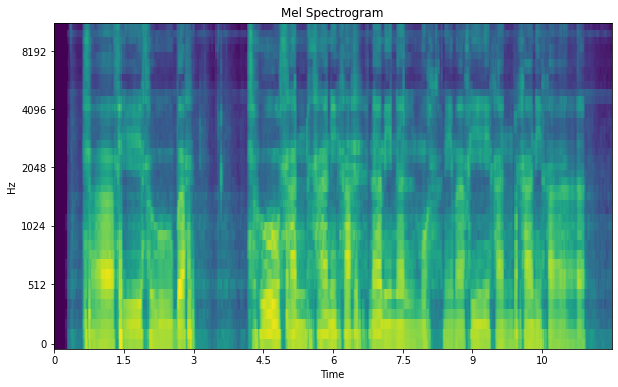

In [128]:
# Menampilkan hasil Mel spectrogram
fig, ax = plt.subplots(figsize=(10, 6))
fig.patch.set_facecolor('white')  # Set background color to white

librosa.display.specshow(librosa.power_to_db(mel_spectogram, ref=np.max), x_axis='time', y_axis='mel', sr=sr, hop_length=512, cmap='viridis', ax=ax)
# plt.colorbar(format='%+2.0f dB')

plt.title('Mel Spectrogram')
plt.show()


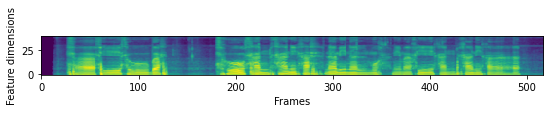

In [130]:
# Plot log-Mel spectrogram
fig, ax = plt.subplots(figsize=(9, 5))
fig.patch.set_facecolor('white')
ax.imshow(librosa.power_to_db(mel_spectogram, ref=np.max), origin="lower", interpolation="nearest");
plt.ylabel("Feature dimensions")
plt.xlabel("Frames");

In [97]:
sr = librosa.get_samplerate(audio_file)
print(sr)
stream = librosa.stream(audio_file, block_length=10,
                        frame_length=256, hop_length=100)
for n, y in enumerate(stream):
    n_frame = librosa.blocks_to_frames(n, block_length=16)

48000


In [98]:
n_frame

9200